### Evghenii Gaisinschii 336551072
### Eugene Golovanov 323554121

In [1]:
import pandas as pd
import numpy as np
import math

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel
from sklearn.metrics.pairwise import cosine_similarity
import time
from datetime import datetime 
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer 
from textblob import Word 
from scipy import spatial

from gensim import models
from gensim import corpora
from gensim.utils import simple_preprocess

import matplotlib.pyplot as plt

In [2]:
start_program = datetime.now() 

## TF IDF

"normalization" & :
 # Code
    Sum=Sum+(x[pointer]*y[pointer])
    result = result +(val*val)
        return math.sqrt(result)



## Vector space model

Gives option to put difrent data type on same dementional model 

* nice option but is where more options to do same work ?

In [3]:
import os


#matrix from home work 2
class matrix:
    def __init__(self,df,id_len=100):
        
        self.df=df.fillna("")
        self.id_len=id_len 
        split_test1=(self.df["tweet"][:id_len]).values
        self.wordList=set((' '.join(list((np.array_split(split_test1,1))[0]))).split())
       
  
        # Convert the dictionary into DataFrame 
        self.new_df = pd.DataFrame( [[bool(False)]*len(self.wordList)]*self.id_len )
        self.new_df.columns = self.wordList
        
        
        ID=0
        for tweet in self.df["tweet"][:id_len]:
            tokens = tweet.split()
            for token in tokens:
                if token in self.wordList:
                    self.new_df[token][ID]=bool(True)
            ID += 1
            
        
        #2.1.1
        print("")
        print("#2.1.1")
        self.new_df.to_csv('out_matrix.csv', index=False)
        print("file out.csv saved ")
        self.new_df.T.to_csv('out_matrix_T.csv', index=False)
        print("file out_T.csv saved ")
        
        

        
        #2.1.2
        print("")
        print("#2.1.2")
        print("File size : ",os.path.getsize('out_matrix.csv'),"Byte")

        
        
        
        #2.1.3
        print("")
        print("#2.1.3")
        
        #print(self.new_df.value_counts())
        #for word in self.new_df:
            #print(self.new_df[word].value_counts())      
                
        print("")
        print("")
        print(self.new_df.head())
                        
    
    def And(self, words_list=[]):
        """
        works like set operator "intersection"
        
        :param words_list: list of words to find
        :return: appearences of words_list sorted by intersection-operrator
        """
        set_dict={}
        for word in words_list:
            if word not in self.new_df:
                return "No match"

            tempData=(self.new_df[word].loc[self.new_df[word]==True]).index

            set_dict[word]=set(tempData.values)

        result=None
        
        for word in set_dict:
            if result == None:
                result = set_dict[word]

            else:
                result = (set(result)).intersection(set(set_dict[word]))
                
  
            new_result=[]
    
            for index in result:
                new_result.append(index + 1)
       
        return new_result
       
    def Or(self, words_list):
        """
        works like set operator "union"
        
        :param words_list: list of words to find
        :return: appearences of words_list sorted by union-operrator
        """
        set_dict={}
        for word in words_list:
            if word not in self.new_df:
                set_dict[word]=[]
                #return "No match"
            else:
                tempData=(self.new_df[word].loc[self.new_df[word]==True]).index
            
                set_dict[word]=set(tempData.values)
            
            #set_dict[word]=[set(self.new_df[word])]
        
        
        result=None
        
        for word in set_dict:
            if result == None:
                result = set_dict[word]
 
            else:
                result = (set(result)).union(set(set_dict[word]))
                    
            new_result=[]
            for index in result:
                new_result.append(index + 1)
        
        return new_result
        
    def Not(self, words_list):
        """
        works like set operator "difference"
        
        :param words_list: list of words to find
        :return: appearences of words_list sorted by difference-operrator
        """
        set_dict={}
        for word in words_list:
            if word not in self.new_df:
                return "No match"
            tempData=(self.new_df[word].loc[self.new_df[word]==True]).index
            
            set_dict[word]=set(tempData.values)
            
        result=None
        
        for word in set_dict:
            if result == None:
                result = set_dict[word]
 
            else:
                result = (set(result)).difference(set(set_dict[word]))
            
            new_result=[]
            
            for index in result:
                new_result.append(index + 1)
                
        return new_result



In [4]:
df = pd.read_csv('ttw2_finalSpell.csv')

M1=matrix(df,id_len=1000)




#2.1.1
file out.csv saved 
file out_T.csv saved 

#2.1.2
File size :  15650306 Byte

#2.1.3


   problems  quality  whatbusiness  keeps   fall  images  recently  \
0     False    False         False  False  False   False     False   
1     False    False         False  False  False   False     False   
2     False    False         False  False  False   False     False   
3     False    False         False  False  False   False     False   
4     False    False         False  False  False   False     False   

   bogummylove  rights  slump  ...    pub  player     ok    yep  cabaret  \
0        False   False  False  ...  False   False  False  False    False   
1        False   False  False  ...  False   False  False  False    False   
2        False   False  False  ...  False   False  False  False    False   
3        False   False  False  ...  False   False  False  False    False   
4        False   False  False  ...  False   False  False  False    False   

   positive  vacation  site

In [5]:
#bag of words
class BOW:
    #3.1
    def __init__(self,df,id_len=1000):
        self.df=df.fillna("")
        split_test=(self.df["tweet"][:id_len]).values
        
        #new_word_list=set((' '.join(list((np.array_split(split_test,1))[0]))).split())

        #print(len(new_word_list))
        self.temp_df = pd.read_csv('out_matrix.csv')
        
        #############
        split_test1=(self.df["tweet"]).values
        print("non set dict  =  ",len((' '.join(list((np.array_split(split_test1,1))[0]))).split()))
        print(" set dict  =  ",len(set((' '.join(list((np.array_split(split_test1,1))[0]))).split())))
        
        #############
        
        
        

        self.wordList=set((' '.join(list((np.array_split(split_test,1))[0]))).split())
        
        
        #print(self.wordList)
        #print("self.wordList : ",self.wordList)
        self.id_len=id_len        
        self.new_df=None
        
        self.create_csv()
        self.count_vector_create()
        self.save_csv()
        
        self.create_cisine_sim_matrix()
        
        
        print("BOW init")
        
    #3.1
    def count_vector_create(self):

        for word in self.wordList:

            if word in self.temp_df:
                tempData=(self.temp_df[word].loc[self.temp_df[word]==True]).index

            for ID in tempData:

                    
                freq=pd.Series(''.join(self.df['tweet'][ID]).split()).value_counts()

                if word in self.temp_df:
                    self.new_df[word][ID]=freq[word]

            
    #3.2+
    
    
    # Convert the dictionary into DataFrame 
    def create_csv(self):
        if self.wordList != None:
            self.new_df = pd.DataFrame( [[int(0)]*len(self.wordList)]*self.id_len )
            self.new_df.columns = self.wordList
            print("create_csv")
    
    def save_csv(self):
        #if self.new_df != None and self.wordList != None:
        self.new_df.to_csv('out_work_3.csv', index=False)
        print("save_csv")
      
    
    
    #create matrix N x N where each value of an represents doc and matrix[doc1][doc2] represents cisine_sim of 2 doc
    def create_cisine_sim_matrix(self):
        self.cisine_sim_matrix=pd.DataFrame( [[float(0)]*self.id_len]*self.id_len )
        for X in range(self.id_len):
            x = self.new_df.iloc[X].values
            for Y in range(X,self.id_len):
                y = self.new_df.iloc[Y].values

                self.cisine_sim_matrix[Y][X]=self.cisine_sim_matrix[X][Y]=self.cisine_sim(x,y)       
        print(self.cisine_sim_matrix)
        
        
    
    #Function for cisine_sim
    def calc_top(self,x=None,y=None):
        Sum=0
        for pointer in range(len(x)):
            Sum=Sum+(x[pointer]*y[pointer])
        return Sum
    
    #Function for cisine_sim
    def calc_gip(self,vec):
        result=0
        for val in vec:
            result = result +(val*val)
        return math.sqrt(result)
    
    #calc cisine_sim
    def cisine_sim(self,x,y):    
        top=self.calc_top(x,y)
        bot=self.calc_gip(x) * self.calc_gip(y)
        return (top/bot)
        
    #create vector for question
    def create_qws(self,words_list=[]):
        self.qws_df = pd.DataFrame( [[int(0)]*len(self.wordList)]*1 )
        self.qws_df.columns = self.new_df.columns
        for word in words_list:
            if word in self.qws_df.columns:
                self.qws_df[word][0] = self.qws_df[word][0] + 1
        return self.qws_df.iloc[0].values       
        
        
    #function to get all doc's sorted by cisine_sim() witch relativ to question
    def find(self,words_list=[]):
        result_arr=[]
        
        y=self.create_qws(words_list)
        for X in range(self.id_len):
            x = self.new_df.iloc[X].values
            result_arr.append([self.cisine_sim(x,y),X])
            print("_____________________________________________________________")
            print("_____________________________________________________________")
            print(" x        =====>  ",x )
            print(" self.cisine_sim(x,y)        =====>  ",self.cisine_sim(x,y) )
            print(" result_arr        =====>  ",result_arr )
            print(" X        =====>  ",X )
            print("_____________________________________________________________")
            print("_____________________________________________________________")
        return result_arr.sort(reverse=False) 
        
    

In [6]:
df = pd.read_csv('ttw2_finalSpell.csv')
b1=BOW(df,1000)

non set dict  =   196788
 set dict  =   19080
create_csv
save_csv
          0         1    2    3    4    5         6         7         8    \
0    1.000000  0.202031  0.0  0.0  0.0  0.0  0.369406  0.000000  0.000000   
1    0.202031  1.000000  0.0  0.0  0.0  0.0  0.522419  0.089087  0.000000   
2    0.000000  0.000000  1.0  0.0  0.0  0.0  0.000000  0.000000  0.000000   
3    0.000000  0.000000  0.0  1.0  0.0  0.0  0.000000  0.000000  0.235702   
4    0.000000  0.000000  0.0  0.0  1.0  0.0  0.000000  0.000000  0.000000   
..        ...       ...  ...  ...  ...  ...       ...       ...       ...   
995  0.000000  0.000000  0.0  0.0  0.0  0.0  0.000000  0.000000  0.000000   
996  0.000000  0.000000  0.0  0.0  0.0  0.0  0.000000  0.000000  0.000000   
997  0.377964  0.534522  0.0  0.0  0.0  0.0  0.977356  0.000000  0.000000   
998  0.000000  0.000000  0.0  0.0  0.0  0.0  0.000000  0.000000  0.000000   
999  0.119523  0.169031  0.0  0.0  0.0  0.0  0.309067  0.105409  0.000000   

         

In [7]:
temp_df_shape = pd.read_csv('out_work_3.csv')
print(temp_df_shape.shape)

(1000, 2606)


In [8]:

class TFIDF:
    #3.3
    def __init__(self,df,id_len=1000):
        self.df=df
        self.id_len=id_len
        col=len(self.df.columns)
        self.new_df = pd.DataFrame( [[float(0)]*col]*self.id_len )
        self.new_df.columns = self.df.columns
        
        self.wordDict = self.df.columns
        
        
        print("shape ---> ",self.new_df.shape)
        #print(self.IDF('user'))
        #print("count --->",self.calc_tfidf())
        self.calc_tfidf()
        self.save_csv()
        print("Init TFIDF Done ")
    
    #3.2
    def calc_tfidf(self):
        count=0

        #print(len(self.df.columns)*1000)
        for word in self.df.columns:
            for ID in range(self.id_len):
                #temp here
                #if word == "user":
                self.new_df[word][ID]=self.TF(word,ID)*self.IDF(word)
                #elif id==5:
                    #self.new_df[word][ID]=self.TF(word,ID)*self.IDF(word)
    
    def TF(self,word,ID):
        if self.df[word][ID]>0:
            tf=(1+np.log(self.df[word][ID]))
            return tf
        else:
            return 0
    def IDF(self,word):
        N = self.id_len
        #kolichestvo dokymentov soderjashih t
        #(self.temp_df[word].loc[self.temp_df[word]==True]).index
        #df_t = (self.df[word].loc[self.df[word]]>0).index
        
        df_t=self.df[word].astype(bool).sum(axis=0)
        
        #print('df_t  =  ',df_t)
        if df_t != 0:
            idf = np.log10(N/df_t)
            return idf
        else:
            return df_t
    
    #3.4
    def create_cisine_sim_matrix(self):
        self.cisine_sim_matrix=pd.DataFrame( [[float(0)]*self.id_len]*self.id_len )
        for X in range(self.id_len):
            x = self.new_df.iloc[X].values
            for Y in range(X,self.id_len):
                y = self.new_df.iloc[Y].values
                
                #top=self.calc_top(x,y)
                #bot=self.calc_gip(x) * self.calc_gip(y) 
                #self.cisine_sim_matrix[X][Y]=(top/bot)
                
                self.cisine_sim_matrix[Y][X]=self.cisine_sim_matrix[X][Y]=self.cisine_sim(x,y)       
        print(self.cisine_sim_matrix)
    
    
    def calc_top(self,x=None,y=None):
        #x = self.df.iloc[0].values
        #y = self.df.iloc[0].values
        #print("x =",x)
        #print("y =",y)
        Sum=0
        for pointer in range(len(x)):
            Sum=Sum+(x[pointer]*y[pointer])
        #print("Sum  =  ",Sum)
        #print("bot ->",self.calc_gip(x) + self.calc_gip(y))
        return Sum
    
    def calc_gip(self,vec):
        result=0
        for val in vec:
            result = result +(val*val)
        return math.sqrt(result)
    
    
    def cisine_sim(self,x,y):    
        top=self.calc_top(x,y)
        bot=self.calc_gip(x) * self.calc_gip(y)
        return (top/bot)
    
    def save_csv(self):
        self.new_df.to_csv('out_work_3_TFIDF.csv', index=False)
        print("save_csv")

        
    def create_qws(self,words_list=[]):
        self.qws_df = pd.DataFrame( [[int(0)]*len(self.wordDict)]*1 )
        print("self.qws_df.shape")
        print(self.qws_df.shape)
        self.qws_df.columns = self.new_df.columns
        print("self.qws_df.columns")
        print(self.qws_df.columns)
        for word in words_list:
            print("self.qws_df.columns")
            print(self.qws_df.columns)
            if word in self.qws_df.columns:
                print("self.qws_df[word][0]")
                print(self.qws_df[word][0])
                self.qws_df[word][0] = self.qws_df[word][0] + 1
                print("self.qws_df.iloc[0].values")
                print(self.qws_df.iloc[0].values)
        return self.qws_df.iloc[0].values       
        
        
        
    def find(self,words_list=[]):
        result_arr=[]
        
        y=self.create_qws(words_list)
        for X in range(self.id_len):
            print("X  -->  ",X-1)
            x = self.new_df.iloc[X-1].values
            print("   x  -->  ",x)
            result_arr.append([self.cisine_sim(x,y),X-1])
            print("result_arr")
            print(result_arr)
            
            print("self.cisine_sim(x,y)")
            print(self.cisine_sim(x,y))
        return result_arr.sort(reverse=False) 

In [9]:
bow_df=pd.read_csv('out_work_3.csv')
i1=TFIDF(bow_df,1000)

shape --->  (1000, 2606)
save_csv
Init TFIDF Done 


In [10]:
print("1")
i1.create_cisine_sim_matrix()
#print(i1.cisine_sim(5,"user"))

1
          0         1    2    3    4    5         6         7         8    \
0    1.000000  0.006840  0.0  0.0  0.0  0.0  0.021331  0.000000  0.000000   
1    0.006840  1.000000  0.0  0.0  0.0  0.0  0.029764  0.064167  0.000000   
2    0.000000  0.000000  1.0  0.0  0.0  0.0  0.000000  0.000000  0.000000   
3    0.000000  0.000000  0.0  1.0  0.0  0.0  0.000000  0.000000  0.136722   
4    0.000000  0.000000  0.0  0.0  1.0  0.0  0.000000  0.000000  0.000000   
..        ...       ...  ...  ...  ...  ...       ...       ...       ...   
995  0.000000  0.000000  0.0  0.0  0.0  0.0  0.000000  0.000000  0.000000   
996  0.000000  0.000000  0.0  0.0  0.0  0.0  0.000000  0.000000  0.000000   
997  0.070016  0.097696  0.0  0.0  0.0  0.0  0.304657  0.000000  0.000000   
998  0.000000  0.000000  0.0  0.0  0.0  0.0  0.000000  0.000000  0.000000   
999  0.004699  0.006556  0.0  0.0  0.0  0.0  0.020445  0.093887  0.000000   

          9    ...  990  991  992       993  994  995  996       997  998

In [11]:
#i1.calc_top()

In [12]:
## perevernyti tfidf i iskati po slovam
## sim bydet iskati po slovam
## ispolzovati sim na bow i na TFIDF

In [13]:
print(i1.find("user"))


self.qws_df.shape
(1, 2606)
self.qws_df.columns
Index(['problems', 'quality', 'whatbusiness', 'keeps', 'fall', 'images',
       'recently', 'bogummylove', 'rights', 'slump',
       ...
       'pub', 'player', 'ok', 'yep', 'cabaret', 'positive', 'vacation',
       'sites', 'sas', 'cancer'],
      dtype='object', length=2606)
self.qws_df.columns
Index(['problems', 'quality', 'whatbusiness', 'keeps', 'fall', 'images',
       'recently', 'bogummylove', 'rights', 'slump',
       ...
       'pub', 'player', 'ok', 'yep', 'cabaret', 'positive', 'vacation',
       'sites', 'sas', 'cancer'],
      dtype='object', length=2606)
self.qws_df[word][0]
0
self.qws_df.iloc[0].values
[0 0 0 ... 0 0 0]
self.qws_df.columns
Index(['problems', 'quality', 'whatbusiness', 'keeps', 'fall', 'images',
       'recently', 'bogummylove', 'rights', 'slump',
       ...
       'pub', 'player', 'ok', 'yep', 'cabaret', 'positive', 'vacation',
       'sites', 'sas', 'cancer'],
      dtype='object', length=2606)
self.qws_d

0.0
X  -->   39
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39]]
self.cisine_sim(x,y)
0.0
X  -->   40
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.

X  -->   65
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65]]
self.cisine_sim(x,y)
0.0
X  -->   66
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6],

result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 82], [0.0, 83], [0.0, 84], [0.0, 85], [0.0, 86]

0.0
X  -->   105
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], 

   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 82], [0.0, 

result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 82], [0.0, 83], [0.0, 84], [0.0, 85], [0.0, 86]

result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 82], [0.0, 83], [0.0, 84], [0.0, 85], [0.0, 86]

   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 82], [0.0, 

result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 82], [0.0, 83], [0.0, 84], [0.0, 85], [0.0, 86]

result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 82], [0.0, 83], [0.0, 84], [0.0, 85], [0.0, 86]

result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 82], [0.0, 83], [0.0, 84], [0.0, 85], [0.0, 86]

X  -->   290
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0

result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 82], [0.0, 83], [0.0, 84], [0.0, 85], [0.0, 86]

X  -->   336
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0

X  -->   360
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0

0.0
X  -->   379
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], 

0.0
X  -->   403
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], 

   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 82], [0.0, 

0.0
X  -->   460
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], 

X  -->   485
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0

0.0
X  -->   512
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], 

X  -->   532
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0

0.0
X  -->   554
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], 

result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 82], [0.0, 83], [0.0, 84], [0.0, 85], [0.0, 86]

result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 82], [0.0, 83], [0.0, 84], [0.0, 85], [0.0, 86]

result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 82], [0.0, 83], [0.0, 84], [0.0, 85], [0.0, 86]

result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 82], [0.0, 83], [0.0, 84], [0.0, 85], [0.0, 86]

0.0
X  -->   646
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], 

X  -->   666
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0

X  -->   692
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0

X  -->   712
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0

X  -->   733
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0

X  -->   759
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0

result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 82], [0.0, 83], [0.0, 84], [0.0, 85], [0.0, 86]

X  -->   801
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0

   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 82], [0.0, 

X  -->   850
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0

X  -->   875
   x  -->   [0. 0. 0. ... 0. 0. 0.]
result_arr
[[0.0, -1], [0.0, 0], [0.0, 1], [0.0, 2], [0.41596383534793235, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.41596383534793235, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [14]:
print(b1.find("user"))

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0]]
 X        =====>   0
_____________________________________________________________
_____________________________________________________________
_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1]]
 X        =====>   1
_____________________________________________________________
_____________________________________________________________
_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr  

 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20]]
 X        =====>   20
_____________________________________________________________
_____________________________________________________________
_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21]]
 X        =====>   21
_________

 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39]]
 X        =====>   39
_____________________________________________________________
_____________________________________________________________
_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [

 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59]]
 X        =====>   59
_____________________________________________________________
_____________________________________________________________
_____________________________________________________________
_________________________________________

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], 

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], 

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], 

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], 

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], 

 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 8

 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 8

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], 

 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 8

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], 

 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 8

 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 8

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], 

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], 

 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 8

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], 

 X        =====>   399
_____________________________________________________________
_____________________________________________________________
_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 5

 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 8

 X        =====>   442
_____________________________________________________________
_____________________________________________________________
_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 5

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.4999999999999999
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 6

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], 

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], 

 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 8

 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 82], [0.0, 83], [0.0, 84], [0.0, 85], [0.0,

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], 

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], 

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], 

_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 7

_____________________________________________________________
_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], 

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], 

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], 

 X        =====>   749
_____________________________________________________________
_____________________________________________________________
_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 5

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], 

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], 

_____________________________________________________________
_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.0, 79], [0.0, 80], [0.0, 81], [0.0, 82], [0.0, 83], [0.0, 84], [0.0, 85], 

 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 73], [0.0, 74], [0.0, 75], [0.0, 76], [0.0, 77], [0.0, 78], [0.

_____________________________________________________________
 x        =====>   [0 0 0 ... 0 0 0]
 self.cisine_sim(x,y)        =====>   0.0
 result_arr        =====>   [[0.0, 0], [0.0, 1], [0.0, 2], [0.4714045207910316, 3], [0.0, 4], [0.0, 5], [0.0, 6], [0.0, 7], [0.0, 8], [0.0, 9], [0.0, 10], [0.0, 11], [0.0, 12], [0.0, 13], [0.0, 14], [0.0, 15], [0.0, 16], [0.0, 17], [0.0, 18], [0.0, 19], [0.0, 20], [0.0, 21], [0.0, 22], [0.0, 23], [0.0, 24], [0.0, 25], [0.0, 26], [0.0, 27], [0.0, 28], [0.0, 29], [0.0, 30], [0.0, 31], [0.0, 32], [0.0, 33], [0.0, 34], [0.0, 35], [0.0, 36], [0.0, 37], [0.0, 38], [0.0, 39], [0.0, 40], [0.0, 41], [0.0, 42], [0.0, 43], [0.0, 44], [0.0, 45], [0.4714045207910316, 46], [0.0, 47], [0.0, 48], [0.0, 49], [0.0, 50], [0.0, 51], [0.0, 52], [0.0, 53], [0.0, 54], [0.0, 55], [0.0, 56], [0.0, 57], [0.0, 58], [0.0, 59], [0.0, 60], [0.0, 61], [0.0, 62], [0.0, 63], [0.0, 64], [0.0, 65], [0.0, 66], [0.0, 67], [0.0, 68], [0.0, 69], [0.0, 70], [0.0, 71], [0.0, 72], [0.0, 7

## TIME
 long time for creation of create_cisine_sim_matrix(self):
 and nice time for creation array of doc/N sorted by apearence of "user" in doc

### ALSO
need to change stract to improve time

In [15]:
print('Time after first part (hh:mm:ss.ms): "{}"'.format(datetime.now() - start_program))

Time after first part (hh:mm:ss.ms): "1:50:33.716592"


In [16]:
ttw = pd.read_csv('ttw2_finalSpell.csv')
ttw=ttw.fillna("")
ttw.dropna(inplace=True)
ttw2 = ttw.copy()
five_ttw=ttw2['tweet'][:1000].tolist()

### tfidf 1

In [17]:
# from sklearn.feature_extraction.text import TfidfVectorizer
first_time = datetime.now() 

vectorizer = TfidfVectorizer(stop_words = 'english')
vectors = vectorizer.fit_transform(five_ttw)
feature_names = vectorizer.get_feature_names()
dense = vectors.todense()
denselist = dense.tolist()
df = pd.DataFrame(denselist, columns=feature_names)
first_time_final = datetime.now() - first_time
print('Time elapsed in (hh:mm:ss.ms): "{}"'.format(first_time_final))
df

Time elapsed in (hh:mm:ss.ms): "0:00:00.690586"


,aaa,aaahhhhh,abc,able,absolutely,abundant,acceptance,access,accountable,acid,...,yup,yyyy,zanne,ze,zero,zi,zimbabwe,zone,zones,zpamdelacruz
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### cosin sim 1

In [18]:
#from sklearn.metrics.pairwise import linear_kernel
first_cos_time = datetime.now() 

cosine_similarities = linear_kernel(vectors)

first_cos_time_final = datetime.now() - first_cos_time
print('Time elapsed in (hh:mm:ss.ms): "{}"'.format(first_cos_time_final))
pd.DataFrame(cosine_similarities, index = five_ttw, columns = five_ttw)

Time elapsed in (hh:mm:ss.ms): "0:00:00.007996"


,user father dysfunctional selfish drags kids dysfunction,user user thanks credit cant use cause dont offer wheelchair vans px,birthday majesty,model love u take u time ur,factsguide society,huge fan fare big talking leave chaos pay disputes get,user camping tomorrow user user user user user user user danny,next school year year exams cant think,love land,user user welcome im,...,nothappy career finishing one week,closeencounters,gymmorgon wing,glad arrived safely user,defines historically historicprivileged,really pretending,finally found way delete old tweets might find useful well,user,put yet havent see makes,user next chapter life star soon looking house today fianc
user father dysfunctional selfish drags kids dysfunction,1.000000,0.025557,0.0,0.0,0.0,0.0,0.102152,0.0,0.000000,0.059360,...,0.0,0.0,0.0,0.021026,0.0,0.0,0.0,0.123885,0.0,0.014813
user user thanks credit cant use cause dont offer wheelchair vans px,0.025557,1.000000,0.0,0.0,0.0,0.0,0.170104,0.0,0.000000,0.098847,...,0.0,0.0,0.0,0.035012,0.0,0.0,0.0,0.206293,0.0,0.024666
birthday majesty,0.000000,0.000000,1.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000
model love u take u time ur,0.000000,0.000000,0.0,1.0,0.0,0.0,0.000000,0.0,0.226563,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000
factsguide society,0.000000,0.000000,0.0,0.0,1.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
really pretending,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,1.0,0.0,0.000000,0.0,0.000000
finally found way delete old tweets might find useful well,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,1.0,0.000000,0.0,0.000000
user,0.123885,0.206293,0.0,0.0,0.0,0.0,0.824573,0.0,0.000000,0.479158,...,0.0,0.0,0.0,0.169720,0.0,0.0,0.0,1.000000,0.0,0.119567
put yet havent see makes,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,1.0,0.000000


### cosin sim 2

In [19]:
#from sklearn.metrics.pairwise import cosine_similarity
second_cos_time = datetime.now() 

cosine = cosine_similarity(vectors, vectors)
second_cos_time_final = datetime.now() - second_cos_time
print('Time elapsed in (hh:mm:ss.ms): "{}"'.format(second_cos_time_final))
pd.DataFrame(cosine, index = five_ttw, columns = five_ttw)

Time elapsed in (hh:mm:ss.ms): "0:00:00.008995"


,user father dysfunctional selfish drags kids dysfunction,user user thanks credit cant use cause dont offer wheelchair vans px,birthday majesty,model love u take u time ur,factsguide society,huge fan fare big talking leave chaos pay disputes get,user camping tomorrow user user user user user user user danny,next school year year exams cant think,love land,user user welcome im,...,nothappy career finishing one week,closeencounters,gymmorgon wing,glad arrived safely user,defines historically historicprivileged,really pretending,finally found way delete old tweets might find useful well,user,put yet havent see makes,user next chapter life star soon looking house today fianc
user father dysfunctional selfish drags kids dysfunction,1.000000,0.025557,0.0,0.0,0.0,0.0,0.102152,0.0,0.000000,0.059360,...,0.0,0.0,0.0,0.021026,0.0,0.0,0.0,0.123885,0.0,0.014813
user user thanks credit cant use cause dont offer wheelchair vans px,0.025557,1.000000,0.0,0.0,0.0,0.0,0.170104,0.0,0.000000,0.098847,...,0.0,0.0,0.0,0.035012,0.0,0.0,0.0,0.206293,0.0,0.024666
birthday majesty,0.000000,0.000000,1.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000
model love u take u time ur,0.000000,0.000000,0.0,1.0,0.0,0.0,0.000000,0.0,0.226563,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000
factsguide society,0.000000,0.000000,0.0,0.0,1.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
really pretending,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,1.0,0.0,0.000000,0.0,0.000000
finally found way delete old tweets might find useful well,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,1.0,0.000000,0.0,0.000000
user,0.123885,0.206293,0.0,0.0,0.0,0.0,0.824573,0.0,0.000000,0.479158,...,0.0,0.0,0.0,0.169720,0.0,0.0,0.0,1.000000,0.0,0.119567
put yet havent see makes,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,1.0,0.000000


### cosin sim 3

In [20]:
#from scipy import spatial
start_time = datetime.now() 

dataSetI = [3, 45, 7, 2]
dataSetII = [2, 54, 13, 15]
result = 1 - spatial.distance.cosine(dataSetI, dataSetII)
print(result)
print('Time elapsed in (hh:mm:ss.ms): "{}"'.format(datetime.now() - start_time))

0.97228425171235
Time elapsed in (hh:mm:ss.ms): "0:00:00.001000"


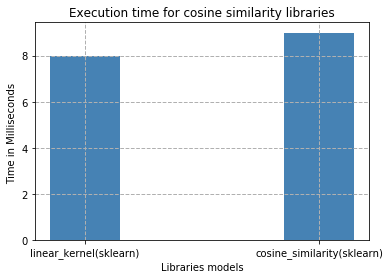

In [21]:
l = [first_cos_time_final.microseconds/1000,second_cos_time_final.microseconds/1000]
x = np.arange(len(l))
plt.bar(x+1,l,width = 0.3, color = 'steelblue')
plt.grid( linestyle='--', linewidth=1)
plt.xlabel('Libraries models')
plt.ylabel('Time in Milliseconds ')
plt.xticks([1,2],['linear_kernel(sklearn)','cosine_similarity(sklearn)'])
plt.title('Execution time for cosine similarity libraries')
plt.yticks()
plt.style.use('default')
plt.show()

### tfidf 2

In [22]:
second_time = datetime.now() 

documents = five_ttw

# Create the Dictionary and Corpus
mydict = corpora.Dictionary([simple_preprocess(line) for line in documents])
corpus = [mydict.doc2bow(simple_preprocess(line)) for line in documents]

# Create the TF-IDF model
tfidf = models.TfidfModel(corpus, smartirs='ntc')

# Show the TF-IDF weights
for doc in tfidf[corpus]:
    print([[mydict[id], np.around(freq, decimals=2)] for id, freq in doc])

second_time_final = datetime.now() - second_time
print('Time elapsed in (hh:mm:ss.ms): "{}"'.format(second_time_final))

[['drags', 0.44], ['dysfunction', 0.44], ['dysfunctional', 0.44], ['father', 0.32], ['kids', 0.37], ['selfish', 0.4], ['user', 0.07]]
[['user', 0.12], ['cant', 0.22], ['cause', 0.37], ['credit', 0.37], ['dont', 0.2], ['offer', 0.31], ['px', 0.37], ['thanks', 0.27], ['use', 0.25], ['vans', 0.37], ['wheelchair', 0.37]]
[['birthday', 0.5], ['majesty', 0.86]]
[['love', 0.37], ['model', 0.52], ['take', 0.44], ['time', 0.42], ['ur', 0.47]]
[['factsguide', 0.71], ['society', 0.71]]
[['big', 0.29], ['chaos', 0.35], ['disputes', 0.39], ['fan', 0.27], ['fare', 0.39], ['get', 0.2], ['huge', 0.33], ['leave', 0.29], ['pay', 0.29], ['talking', 0.33]]
[['user', 0.64], ['camping', 0.46], ['danny', 0.51], ['tomorrow', 0.35]]
[['cant', 0.27], ['exams', 0.44], ['next', 0.3], ['school', 0.35], ['think', 0.28], ['year', 0.66]]
[['love', 0.45], ['land', 0.89]]
[['user', 0.32], ['im', 0.49], ['welcome', 0.81]]
[['climbed', 0.43], ['consumer', 0.43], ['index', 0.36], ['may', 0.29], ['mom', 0.32], ['previous',

[['user', 0.09], ['dont', 0.3], ['get', 0.29], ['two', 0.41], ['bed', 0.57], ['youtu', 0.57]]
[['want', 0.34], ['anyone', 0.5], ['kind', 0.53], ['despise', 0.59]]
[['im', 0.31], ['life', 0.36], ['nice', 0.46], ['done', 0.48], ['trying', 0.58]]
[['user', 0.4], ['thanks', 0.62], ['latest', 0.67]]
[['want', 0.19], ['gun', 0.25], ['club', 0.28], ['violence', 0.3], ['spark', 0.3], ['bodies', 0.33], ['debate', 0.33], ['inside', 0.33], ['photos', 0.33], ['release', 0.33], ['serious', 0.33]]
[['feeling', 0.35], ['arrived', 0.43], ['fo', 0.46], ['blagoevgrad', 0.51], ['once', 0.46]]
[['user', 0.11], ['coming', 0.53], ['number', 0.58], ['leaders', 0.62]]
[['user', 0.16], ['see', 0.58], ['yesterday', 0.8]]
[['user', 0.09], ['means', 0.46], ['like', 0.29], ['doesnt', 0.44], ['isnt', 0.46], ['mean', 0.55]]
[['great', 0.43], ['way', 0.42], ['spend', 0.63], ['saturday', 0.49]]
[['test', 0.45], ['usd', 0.38], ['could', 0.4], ['nearer', 0.5], ['westpac', 0.5]]
[['fight', 0.31], ['asking', 0.31], ['mone

### tfidf 3

In [23]:
#from tfidf import TfIdf
#start_time = datetime.now() 

#table = TfIdf()
#table.add_document("foo", ["alpha", "bravo", "charlie", "delta", "echo", "foxtrot", "golf", "hotel"])
#table.add_document("bar", ["alpha", "bravo", "charlie", "india", "juliet", "kilo"])
#table.add_document("baz", ["kilo", "lima", "mike", "november"])

#print(table.similarities(["alpha", "bravo", "charlie"])) # => [['foo', 0.6875], ['bar', 0.75], ['baz', 0.0]]
#print('Time elapsed in (hh:mm:ss.ms): "{}"'.format(datetime.now() - start_time))

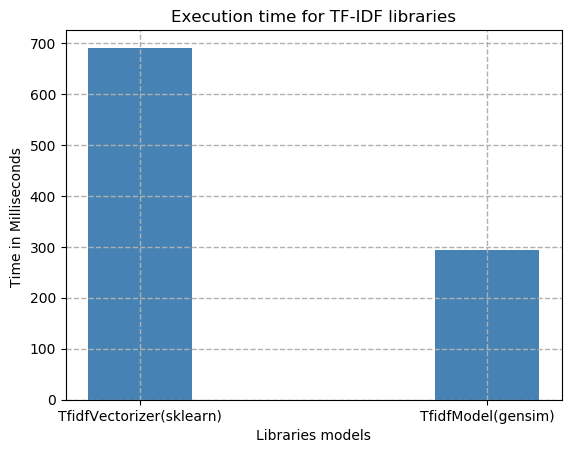

In [24]:
l = [first_time_final.microseconds/1000,second_time_final.microseconds/1000]
x = np.arange(len(l))
plt.bar(x+1,l,width = 0.3, color = 'steelblue')
plt.grid( linestyle='--', linewidth=1)
plt.xlabel('Libraries models')
plt.ylabel('Time in Milliseconds ')
plt.xticks([1,2],['TfidfVectorizer(sklearn)','TfidfModel(gensim)'])
plt.title('Execution time for TF-IDF libraries')
plt.yticks()
plt.style.use('default')
plt.show()

In [25]:
print('Time after whole program (hh:mm:ss.ms): "{}"'.format(datetime.now() - start_program))

Time after whole program (hh:mm:ss.ms): "1:50:35.459594"


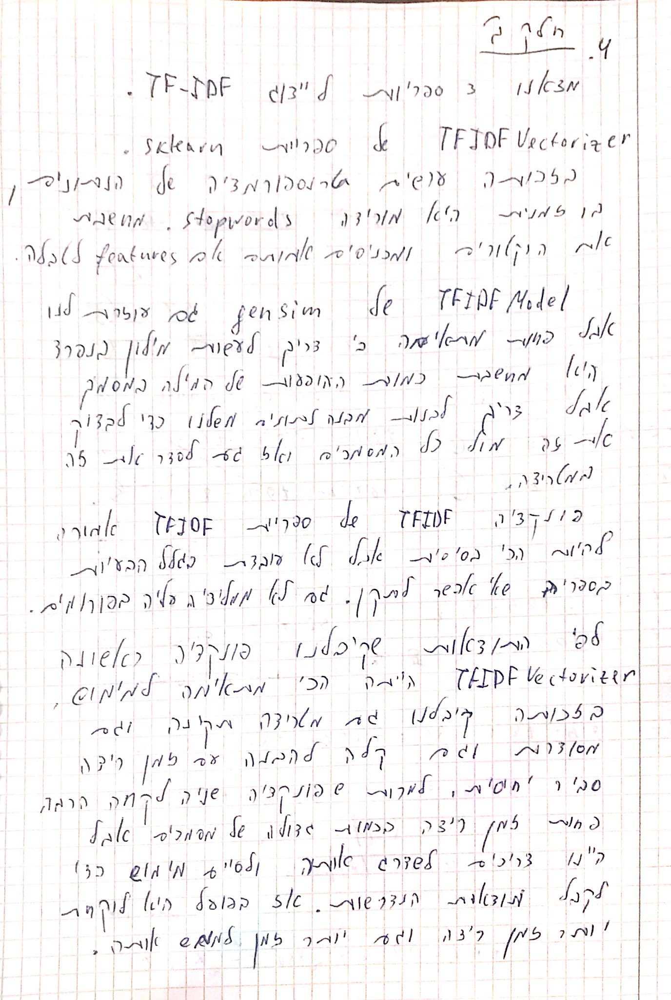

In [26]:
from IPython.display import Image
Image("Desktop\IR_Lab3.jpg")

### Summary

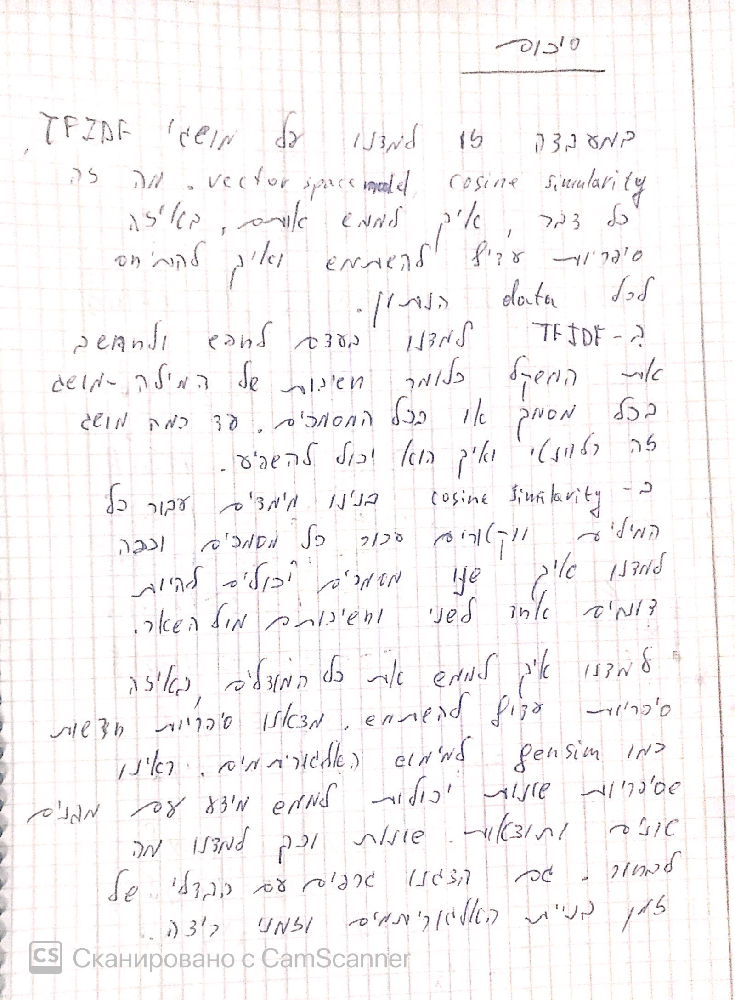

In [27]:
from IPython.display import Image
Image("Desktop\IR_Lab3_Summary.jpg")